In [1]:
import pandas as pd
import requests
import folium
import numpy as np
import matplotlib.pyplot as plt
import datetime



from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import mean_squared_error
import os

# 1. data preparation and preprocessing

In [2]:
# link for the data set  :  'https://query.data.world/s/xh4x5sa3ta5h42meq2fmke37gfjner'
df_m = pd.read_csv('https://query.data.world/s/xh4x5sa3ta5h42meq2fmke37gfjner')

In [32]:
df = df_m
df.tail(50)

,COUNTY_NAME,COUNTY_FIPS_NUMBER,PEOPLE_POSITIVE_CASES_COUNT,REPORT_DATE,PROVINCE_STATE_NAME,CONTINENT_NAME,DATA_SOURCE_NAME,PEOPLE_DEATH_NEW_COUNT,COUNTRY_ALPHA_3_CODE,COUNTRY_SHORT_NAME,COUNTRY_ALPHA_2_CODE,PEOPLE_POSITIVE_NEW_CASES_COUNT,PEOPLE_DEATH_COUNT
449144,NaN,NaN,0,2/12/2020,NaN,Asia,European Centre for Disease Prevention and Con...,0,MMR,Myanmar,MMR,0,0
449145,NaN,NaN,576,3/24/2020,NaN,Europe,European Centre for Disease Prevention and Con...,5,ROU,Romania,ROU,143,7
449146,NaN,NaN,105,4/15/2020,NaN,America,European Centre for Disease Prevention and Con...,1,JAM,Jamaica,JAM,32,5
449147,NaN,NaN,3,4/8/2020,NaN,Africa,European Centre for Disease Prevention and Con...,0,BDI,Burundi,BDI,0,0
449148,NaN,NaN,68192,4/11/2020,NaN,Asia,European Centre for Disease Prevention and Con...,122,IRN,Iran,IRN,1972,4232
449149,NaN,NaN,0,1/26/2020,NaN,America,European Centre for Disease Prevention and Con...,0,VEN,Venezuela,VEN,0,0
449150,NaN,NaN,0,2/28/2020,NaN,Africa,European Centre for Disease Prevention and Con...,0,COG,Congo,COG,0,0
449151,NaN,NaN,18,5/20/2020,NaN,America,European Centre for Disease Prevention and Con...,0,BLZ,Belize,BLZ,0,2
449152,NaN,NaN,0,1/17/2020,NaN,Europe,European Centre for Disease Prevention and Con...,0,SWE,Sweden,SWE,0,0
449153,NaN,NaN,0,1/5/2020,NaN,Europe,European Centre for Disease Prevention and Con...,0,FIN,Finland,FIN,0,0


In [33]:
df = df.groupby('COUNTRY_SHORT_NAME')



In [34]:
"""for oj in df:
    print(oj[0])
    print(oj[1])
    break"""

'for oj in df:\n    print(oj[0])\n    print(oj[1])\n    break'

In [35]:
dic = {'name' : list()  ,'data_pred_new_cases' : list() , 'total_cases' : list() , 'total_deaths': list()} #, 'country_short_name' : list()


for obj in df:
    name = obj[0]
    df_w = obj[1]
    l = []
    for i in range(len(df_w)):
        l.append(datetime.datetime.strptime(list(df_w.iloc[i])[3], '%m/%d/%Y'))
    df_w['n_date'] = l 
    
    df_w = df_w.drop(columns=['REPORT_DATE' ,'COUNTY_NAME' ,'CONTINENT_NAME' , 'COUNTY_FIPS_NUMBER' , 'COUNTRY_SHORT_NAME' ,'PROVINCE_STATE_NAME' ,'DATA_SOURCE_NAME' , 'COUNTRY_ALPHA_3_CODE' ,'COUNTRY_ALPHA_2_CODE'])

    
    df_w = df_w.sort_values('n_date')
    
    #print(df_w)
    dic['name'].append(name)
    #dic['country_short_name'].append( list(df_w.iloc[1])[2])
    dic['data_pred_new_cases'].append(list(df_w['PEOPLE_POSITIVE_NEW_CASES_COUNT']))
    dic['total_cases'].append(list(df_w['PEOPLE_POSITIVE_CASES_COUNT'])[-1])
    dic['total_deaths'].append(list(df_w['PEOPLE_DEATH_COUNT'])[-1])
    
    #print('\n\n\n\n')
    
    #print(df_w.tail(20))
    
    #print(dic)

df_final = pd.DataFrame(dic)
df_final
    

C:\Users\Vaibhav Mankar\anaconda3\lib\site-packages\ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.


,name,data_pred_new_cases,total_cases,total_deaths
0,Afghanistan,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",18969,309
1,Albania,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",1212,33
2,Algeria,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",9935,690
3,Andorra,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",852,51
4,Angola,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",86,4
...,...,...,...,...
200,Vietnam,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",329,0
201,Western Sahara,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",23,1
202,Yemen,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",469,111
203,Zambia,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",1111,7


In [36]:
c_names = dic['name']
'United States' in c_names

True

# Working on USA and Canada 

In [37]:
df_uc = df_m
df_uc

,COUNTY_NAME,COUNTY_FIPS_NUMBER,PEOPLE_POSITIVE_CASES_COUNT,REPORT_DATE,PROVINCE_STATE_NAME,CONTINENT_NAME,DATA_SOURCE_NAME,PEOPLE_DEATH_NEW_COUNT,COUNTRY_ALPHA_3_CODE,COUNTRY_SHORT_NAME,COUNTRY_ALPHA_2_CODE,PEOPLE_POSITIVE_NEW_CASES_COUNT,PEOPLE_DEATH_COUNT
0,Clarion,42031.0,0,2/17/2020,Pennsylvania,America,New York Times,0,USA,United States,US,0,0
1,Clarion,42031.0,25,5/21/2020,Pennsylvania,America,New York Times,0,USA,United States,US,0,2
2,Clarion,42031.0,25,5/28/2020,Pennsylvania,America,New York Times,0,USA,United States,US,0,2
3,Clarion,42031.0,23,5/6/2020,Pennsylvania,America,New York Times,0,USA,United States,US,0,1
4,Clarion,42031.0,16,4/14/2020,Pennsylvania,America,New York Times,0,USA,United States,US,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
449189,NaN,NaN,1,2/22/2020,NaN,Europe,European Centre for Disease Prevention and Con...,0,FIN,Finland,FIN,0,0
449190,NaN,NaN,0,1/11/2020,NaN,Africa,European Centre for Disease Prevention and Con...,0,COG,Congo,COG,0,0
449191,NaN,NaN,0,2/6/2020,NaN,Asia,European Centre for Disease Prevention and Con...,0,KAZ,Kazakhstan,KAZ,0,0
449192,NaN,NaN,3513,5/30/2020,NaN,Asia,European Centre for Disease Prevention and Con...,0,UZB,Uzbekistan,UZB,69,14


In [38]:
df_u = df_uc[ df_uc['COUNTRY_SHORT_NAME'] == 'United States' ]
df_u = df_u.drop(columns = ['COUNTY_NAME' , 'COUNTY_FIPS_NUMBER', 'PROVINCE_STATE_NAME' , 'CONTINENT_NAME' , 'DATA_SOURCE_NAME' , 'COUNTRY_ALPHA_3_CODE' ,	'COUNTRY_SHORT_NAME' ,	'COUNTRY_ALPHA_2_CODE'  ])
df_u = df_u.groupby('REPORT_DATE').sum()

dicu = {'name' :  'United States'  ,'data_pred_new_cases' : [list(df_u['PEOPLE_POSITIVE_NEW_CASES_COUNT'])] , 'total_cases' : list(df_u['PEOPLE_POSITIVE_CASES_COUNT'])[-1] , 'total_deaths': list(df_u['PEOPLE_DEATH_COUNT'])[-1]} #, 'country_short_name' : list()
dicu

df_u = pd.DataFrame(dicu)
df_u

,name,data_pred_new_cases,total_cases,total_deaths
0,United States,"[1, 0, 0, 1, 1, 2, 0, 0, 0, 1, 1, 1, 1, 0, 1, ...",1911725,109304


In [39]:
df_c = df_uc[ df_uc['COUNTRY_SHORT_NAME'] == 'Canada' ]
df_c = df_c.drop(columns = ['COUNTY_NAME' , 'COUNTY_FIPS_NUMBER', 'PROVINCE_STATE_NAME' , 'CONTINENT_NAME' , 'DATA_SOURCE_NAME' , 'COUNTRY_ALPHA_3_CODE' ,	'COUNTRY_SHORT_NAME' ,	'COUNTRY_ALPHA_2_CODE'  ])
df_c = df_c.groupby('REPORT_DATE').sum()
dicc = {'name' :  'Canada'  ,'data_pred_new_cases' : [list(df_c['PEOPLE_POSITIVE_NEW_CASES_COUNT'])] , 'total_cases' : list(df_c['PEOPLE_POSITIVE_CASES_COUNT'])[-1] , 'total_deaths': list(df_c['PEOPLE_DEATH_COUNT'])[-1]} #, 'country_short_name' : list()
dicc

df_c = pd.DataFrame(dicc)
df_c

,name,data_pred_new_cases,total_cases,total_deaths
0,Canada,"[4, 8, 9, 10, 1, 1, 1, 15, 7, 9, 103, 35, 38, ...",94324,7703


In [40]:
df_final = df_final[df_final.name != 'United States of America' ]
df_final = df_final[df_final.name != 'United States' ]

In [41]:
df_final = df_final[df_final.name != 'Canada' ]

In [42]:
df_final = df_final.append(df_u)

In [43]:
df_final = df_final.append(df_c)
df_final.reset_index(inplace = True, drop = True)  

In [44]:
df_final.tail(60)

,name,data_pred_new_cases,total_cases,total_deaths
145,Panama,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",15463,370
146,Papua New Guinea,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",8,0
147,Paraguay,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",1087,11
148,Peru,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",187400,5162
149,Philippines,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",20626,987
150,Poland,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",25419,1137
151,Portugal,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",33969,1465
152,Qatar,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",65495,49
153,Romania,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",20103,1308
154,Russia,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",449834,5528


# Working on prediction 

In [45]:
config = {
  
    'days_to_forecast': 1,
    'poly_reg_degree': 3,
    'time': int(str(datetime.datetime.now().time())[0:2]),
    'update_data': 18,
    'start_date': datetime.date(2020, 3, 16)
}

In [46]:
# Model predictions
def get_predictions(x, model, degree):
    polynomial_features = PolynomialFeatures(degree=degree)
    x_poly = polynomial_features.fit_transform(x)

    return model.predict(x_poly)



def collect_predictions(data, title):
    if config['time'] >= config['update_data']:
        filename = str(datetime.date.today() + datetime.timedelta(1))

    else:
        filename = str(datetime.date.today())

    filename = filename.replace('-', '_')
    #np.save(title.replace(" ", "") + filename + '.npy', data)



def forecast(model_name, model, degree, beginning_day=0, limit=10):
    next_days_x = np.array(range(beginning_day, beginning_day + limit)).reshape(-1, 1)
    next_days_pred = np.round(get_predictions(next_days_x, model, degree), 0).astype(np.int32)

    #print("The results for " + model_name + " in the following " + str(limit) + " days is:")

    #for i in range(0, limit):
    #    print(str(i + 1) + ": " + str(next_days_pred[i]))
    collect_predictions(next_days_pred, model_name)
    return next_days_pred

def getpred(data , name ):
        cases  = np.array(data)
        series = cases #int(len(cases) - config['days_to_forecast']) 
        degree = config['poly_reg_degree']
        f = np.array(range(0, series.shape[0]))
        f = f.reshape((f.shape[0]), 1)
        series = series.reshape((series.shape[0], 1))
        series = np.concatenate([f, series], axis=1)


        X = series[:, 0].reshape(-1, 1)
        Y = series[:, 1]
        PF = PolynomialFeatures(degree=degree)
        x_poly = PF.fit_transform(X)
        model = LinearRegression()
        model.fit(x_poly, Y)
        y_pred = np.round(get_predictions(X, model, degree), 0).astype(np.int32)

        predictions = forecast(name, model, degree, beginning_day=len(X), limit=config["days_to_forecast"])


        total_days = [datetime.date(2020, 2, 24) + datetime.timedelta(days=int(i)) for i in range(int(Y.shape[0]) + predictions.shape[0])]

        if config['time'] >= config['update_data']:
            today = str(datetime.date.today())
            last_day = str(datetime.date.today() + datetime.timedelta(days=config['days_to_forecast']))
        else:
            today = str(datetime.date.today() - datetime.timedelta(1))
            last_day = str(datetime.date.today() - datetime.timedelta(1) + datetime.timedelta(days=config['days_to_forecast']))

        final_dates = []
        for i in total_days:
            i = str(i)
            final_dates.append(i[5:])

        y = np.array(Y)
        y = y.reshape((y.shape[0]), 1)
        return   np.array(predictions)[0]
   


In [47]:
pred = []
for data in list(df_final['data_pred_new_cases']):
    pred.append(getpred(data , '' ))
    

In [48]:
df_final['prediction'] = pred

In [49]:
df_final.head(60)

,name,data_pred_new_cases,total_cases,total_deaths,prediction
0,Afghanistan,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",18969,309,855
1,Albania,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",1212,33,10
2,Algeria,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",9935,690,156
3,Andorra,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",852,51,-3
4,Angola,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",86,4,2
5,Anguilla,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",3,0,0
6,Antigua and Barbuda,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",26,3,0
7,Argentina,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",21024,632,875
8,Armenia,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",11817,183,505
9,Aruba,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",101,3,-2


In [50]:
df1 = df_final

In [51]:
df1.replace('United States', "United States of America", inplace = True)
df1.replace('Tanzania', "United Republic of Tanzania", inplace = True)
df1.replace('Democratic Republic of Congo', "Democratic Republic of the Congo", inplace = True)
df1.replace('Congo', "Republic of the Congo", inplace = True)
df1.replace('Lao', "Laos", inplace = True)
df1.replace('Syrian Arab Republic', "Syria", inplace = True)
df1.replace('Serbia', "Republic of Serbia", inplace = True)
df1.replace('Czechia', "Czech Republic", inplace = True)
df1.replace('UAE', "United Arab Emirates", inplace = True)

In [52]:
df1.to_csv('Covid-data.csv')
df1.tail(50) # canada , USA  

,name,data_pred_new_cases,total_cases,total_deaths,prediction
155,Rwanda,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",420,2,6
156,Saint Kitts and Nevis,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",15,0,0
157,Saint Lucia,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",19,0,0
158,Saint Vincent and the Grenadines,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",26,0,0
159,San Marino,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",687,42,-4
160,Sao Tome and Principe,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",509,12,17
161,Saudi Arabia,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",95748,642,2685
162,Senegal,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",4155,45,119
163,Republic of Serbia,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",11667,247,-50
164,Seychelles,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",11,0,0


In [24]:
#df1 = pd.read_csv('Covid-data.csv')

# Visualizations

{'total_cases': 36635, 'total_deaths': 1145}


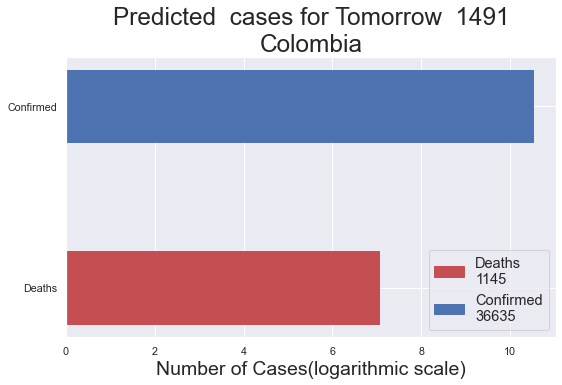

In [25]:
# For one sample 
import seaborn as sns
sns.set()

data = dict(df1.iloc[41, -3:-1])
print(data)
cases = np.log(data['total_cases'])
deaths = np.log(data['total_deaths'])
#recovered = np.log(data['total_recovered'])
values = [cases , deaths ] # recovered
name =  ['Confirmed' , 'Deaths' ] # 'Recovered'
values.reverse()
name.reverse()
fig = plt.figure(figsize = (7, 4) , dpi=70) 
ax = fig.add_axes([0,0,1,1]) 
# creating the bar plot 
barlist = ax.barh(name , values , height= 0.4 ) 
barlist[1].set_color('b') 
barlist[0].set_color('r') 
ax.set_xlabel('Number of Cases'   + "(logarithmic scale)" , fontsize=20)
ax.set_title('Predicted  cases for Tomorrow  ' + str (df1.iloc[41, -1])  + "\n" + str(df1.iloc[41, 0])  , fontsize=25)
#ax.text('Predicted  cases \nfor Tomorrow  ' + str (dp['predictions']) ,loc='center' , fontsize=25 )
ax.legend(barlist[:2] , [   'Deaths\n' + str(data['total_deaths']) , 'Confirmed\n' + str(data['total_cases']) ] ,loc='lower right' ,fontsize=15) #'Recovered\n' + str(data['total_recovered']) 
plt.show()
fig.savefig('vis_data/' +str( df1.iloc[41, 0])  + ".png" , dpi=70, bbox_inches='tight')


C:\Users\Vaibhav Mankar\anaconda3\lib\site-packages\ipykernel_launcher.py:5: RuntimeWarning: divide by zero encountered in log
  """
C:\Users\Vaibhav Mankar\anaconda3\lib\site-packages\ipykernel_launcher.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # This is added back by InteractiveShellApp.init_path()


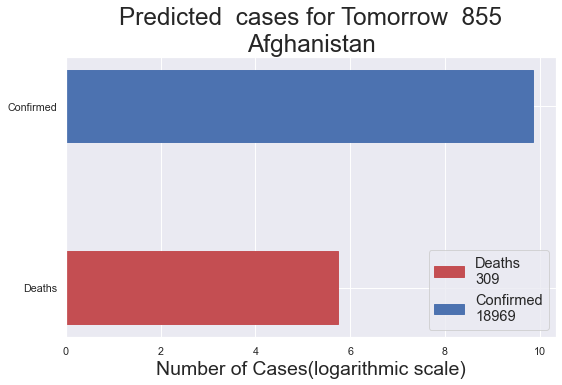

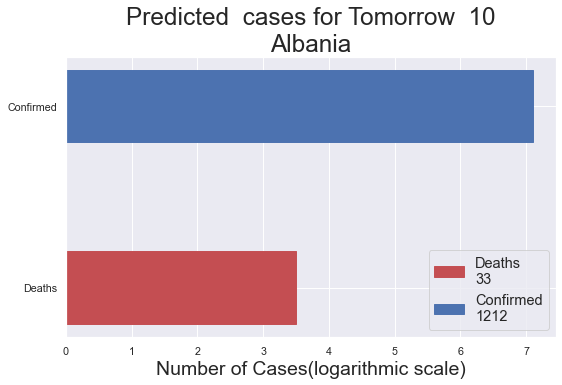

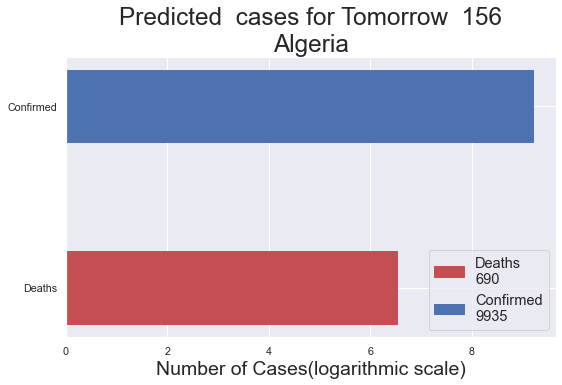

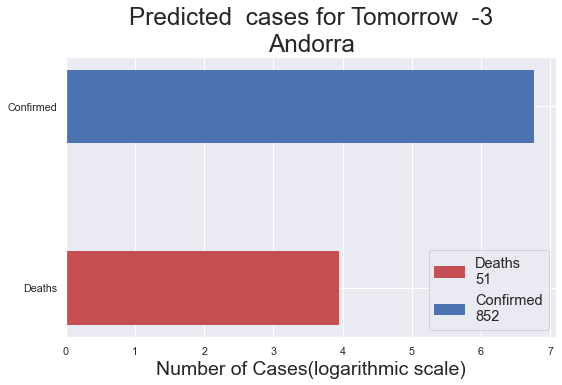

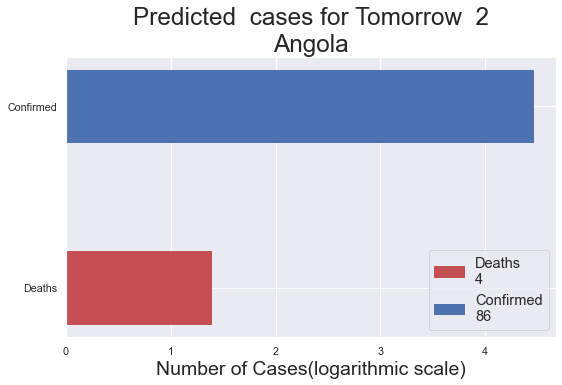

...

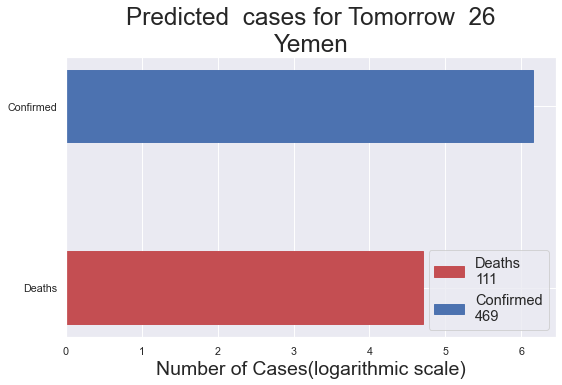

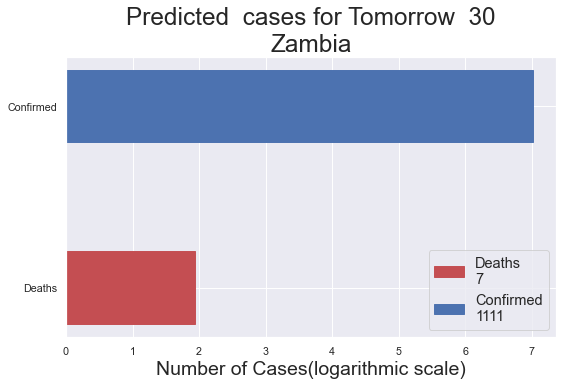

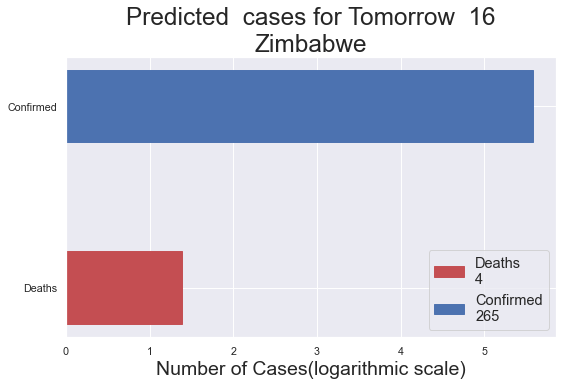

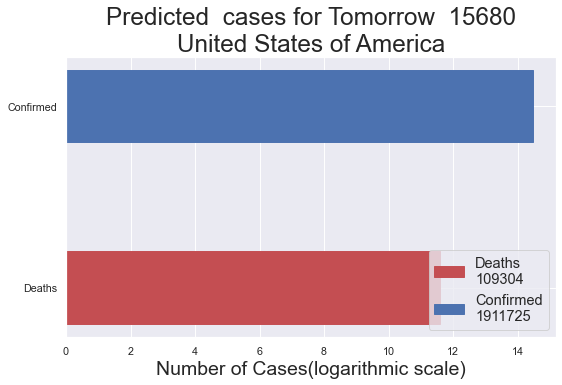

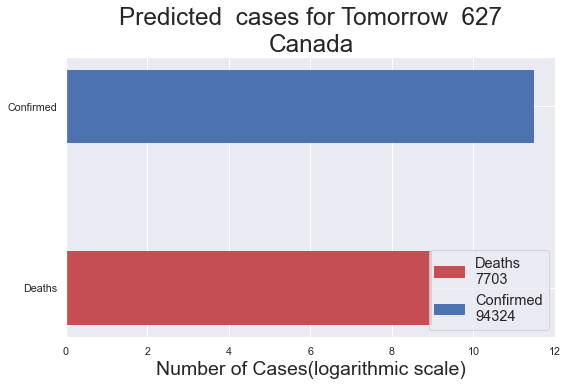

In [26]:
for i in range(len(df1)):
    data = dict(df1.iloc[i, -3:-1])
    #print(data)
    cases = np.log(data['total_cases'])
    deaths = np.log(data['total_deaths'])
    #recovered = np.log(data['total_recovered'])
    values = [cases , deaths ] # recovered
    name =  ['Confirmed' , 'Deaths' ] # 'Recovered'
    values.reverse()
    name.reverse()
    fig = plt.figure(figsize = (7, 4) , dpi=70) 
    ax = fig.add_axes([0,0,1,1]) 
    # creating the bar plot 
    barlist = ax.barh(name , values , height= 0.4 ) 
    barlist[1].set_color('b') 
    barlist[0].set_color('r') 
    ax.set_xlabel('Number of Cases'   + "(logarithmic scale)" , fontsize=20)
    ax.set_title('Predicted  cases for Tomorrow  ' + str (df1.iloc[i, -1])  + "\n" + df1.iloc[i, 0]  , fontsize=25)
    #ax.text('Predicted  cases \nfor Tomorrow  ' + str (dp['predictions']) ,loc='center' , fontsize=25 )
    ax.legend(barlist[:2] , [   'Deaths\n' + str(data['total_deaths']) , 'Confirmed\n' + str(data['total_cases']) ] ,loc='lower right' ,fontsize=15) #'Recovered\n' + str(data['total_recovered']) 
    #plt.show()
    fig.savefig('vis_data/' + df1.iloc[i, 0]  + ".png" , dpi=70, bbox_inches='tight')

In [53]:
url = 'https://raw.githubusercontent.com/python-visualization/folium/master/examples/data'
country_shapes = f'{url}/world-countries.json'


In [54]:
import seaborn as sns
sns.set()
m1 = folium.Map(location = [41.8719, 12.5674] ,tiles = 'cartodbdark_matter' , zoom_start = 2)
df1['total_cases'] = np.log10(df1['total_cases']+1)
bins = list(df1['total_cases'].quantile([0, 0.25, 0.5, 0.75,0.95 ,1]))
folium.Choropleth(
   geo_data=country_shapes,
    name='choropleth',
    data=df1,
    columns=['name', 'total_cases'],
    key_on='feature.properties.name',
    fill_color="Blues" , #'PuRd',
    nan_fill_color='white',
    bins = bins,
    #reset=True,
    legend_name='Confirmed cases log (10^x)'
).add_to(m1)

#folium.TileLayer('Mapbox Bright').add_to(m1)

#folium.LayerControl().add_to(m1)

legend_html = """<link href="//netdna.bootstrapcdn.com/twitter-bootstrap/2.3.2/css/bootstrap-combined.no-icons.min.css" rel="stylesheet">
                <link href="//netdna.bootstrapcdn.com/font-awesome/3.2.1/css/font-awesome.css" rel="stylesheet">
                <div style='padding:10px;background-color:rgba(255,255,255,0.5);position:fixed;bottom:20px;left:20px;z-index:1000'>"""
legend_html += "<div style='width:100%;text-align:center;'><h4>Index for Legend</h4></div><hr style='border-top-color: rgba(25,25,25,0.5);'>"
legend_html += "<ul style='margin:0;padding:0;color: #555;list-style-type:circle;align-item:left;padding-left:20px;padding-right:20px'>"
for i in bins:
    legend_html += "<li style='margin:0;padding:0;line-height: 0;'>Value "+str(np.round(i,2))+" : "+str(int(10**i)-1)+"</li><br>"
legend_html += "</ul></div>"

title_html = """
                <link href="//netdna.bootstrapcdn.com/twitter-bootstrap/2.3.2/css/bootstrap-combined.no-icons.min.css" rel="stylesheet">
                <link href="//netdna.bootstrapcdn.com/font-awesome/3.2.1/css/font-awesome.css" rel="stylesheet">
                <div style='width:100%;text-align:center;'><h1> COVID-19 Prediction Oriented Visualization </h1></div><hr style='border-top-color: rgba(25,25,25,0.5);'>
            """
 


m1.get_root().html.add_child(folium.Element(legend_html))
m1.get_root().html.add_child(folium.Element(title_html))

folium.LayerControl().add_to(m1)

m1

In [55]:
country_loc = pd.read_csv('countries_location.csv')
country_loc.head()


,country,latitude,longitude,name
0,AD,42.546245,1.601554,Andorra
1,AE,23.424076,53.847818,United Arab Emirates
2,AF,33.939110,67.709953,Afghanistan
3,AG,17.060816,-61.796428,Antigua and Barbuda
4,AI,18.220554,-63.068615,Anguilla


In [56]:
'Canada'  in list(country_loc['name'])

True

In [57]:
country_loc.replace('United States', "United States of America", inplace = True)

In [58]:
'United States of America'  in list(country_loc['name'])

True

In [59]:
country = pd.DataFrame({'name' : country_loc['name']   , "latitude" :country_loc['latitude']  , "longitude" : country_loc['longitude']})

country.reset_index(inplace = True, drop = True)  
country.head(5)

,name,latitude,longitude
0,Andorra,42.546245,1.601554
1,United Arab Emirates,23.424076,53.847818
2,Afghanistan,33.939110,67.709953
3,Antigua and Barbuda,17.060816,-61.796428
4,Anguilla,18.220554,-63.068615


In [60]:
import os 
popups = dict()
import base64



for img in os.listdir('vis_data'):
    encoded = base64.b64encode(open('vis_data/' + img , 'rb').read())
    html = '<img src="data:image/png;base64,{}" >'.format
    iframe = folium.IFrame(html(encoded.decode('UTF-8')), width=  600 , height= 420)
    popup = folium.Popup(iframe, max_width=2650)
    popups[img[:-4]] = popup 
    
    
    

In [61]:
l = []
for obj in country['name']:
    #print(type(obj))
    try: 
        l.append(popups[obj])
    except :
        #print("Not matched adding Nan")
        l.append(np.nan)
country['pupup'] = l 
country.dropna()
 

,name,latitude,longitude,pupup
0,Andorra,42.546245,1.601554,<folium.map.Popup object at 0x000002719887B548>
1,United Arab Emirates,23.424076,53.847818,<folium.map.Popup object at 0x000002719898FA08>
2,Afghanistan,33.939110,67.709953,<folium.map.Popup object at 0x000002719887AEC8>
3,Antigua and Barbuda,17.060816,-61.796428,<folium.map.Popup object at 0x000002719887E408>
4,Anguilla,18.220554,-63.068615,<folium.map.Popup object at 0x000002719887B848>
...,...,...,...,...
238,Kosovo,42.602636,20.902977,<folium.map.Popup object at 0x0000027198901F88>
239,Yemen,15.552727,48.516388,<folium.map.Popup object at 0x000002719899D9C8>
241,South Africa,-30.559482,22.937506,<folium.map.Popup object at 0x000002719896ECC8>
242,Zambia,-13.133897,27.849332,<folium.map.Popup object at 0x000002719899DCC8>


In [62]:
for lat, lon, name , popup  in zip(country['latitude'], country['longitude'],country['name'] , country['pupup']):
    folium.CircleMarker(
        [lat, lon ],
        radius = 2,
        popup = popup ,
        color = 'grey',
        fill = True,
        #fill_color = '#31526e',
        fill_opacity = 0.3,
        parse_html = False).add_to(m1)

m1

In [63]:
m1.save("map_vivek_final.html")